<a href="https://colab.research.google.com/github/DongheeKang/MachineLearning/blob/master/Image_style_transfer_with_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Style Transfer with CNN

* Image Style Transfer Using Convolutional Neural Networks (CVPR 2016)
* Image is updated by optimization
* Does not require to calculate gradient
* ML Framework:  PyTorch

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models

import PIL
import matplotlib.pyplot as plt

import copy

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
# Load image and convert to Tensor
def image_loader(img_path, imsize):
    loader = transforms.Compose([
        transforms.Resize(imsize), 
        transforms.ToTensor() # convert to torch.Tensor [0, 255] → [0, 1]
    ])
    image = PIL.Image.open(img_path)
    # add dimension due to batch norm.
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float) # to device


# torch.Tensor image showcase
def imshow(tensor):
    # matplotlib with CPU
    image = tensor.cpu().clone()
    # in torch.Tensor dimesion remove
    image = image.squeeze(0)
    # revert to PIL Object 
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    plt.show()

#### Image Reconstruction

* optimization
* MSE loss

In [9]:
!git clone https://github.com/DongheeKang/MachineLearning

Cloning into 'MachineLearning'...
remote: Enumerating objects: 34, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 34 (delta 5), reused 4 (delta 4), pack-reused 25
Unpacking objects: 100% (34/34), done.


In [10]:
!ls -al

total 20
drwxr-xr-x 1 root root 4096 Jul 30 08:30 .
drwxr-xr-x 1 root root 4096 Jul 30 08:28 ..
drwxr-xr-x 4 root root 4096 Jul 28 13:39 .config
drwxr-xr-x 5 root root 4096 Jul 30 08:30 MachineLearning
drwxr-xr-x 1 root root 4096 Jul 28 13:40 sample_data


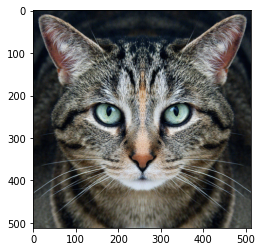

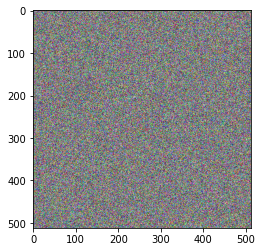

In [11]:
# prepare image
img_path = './MachineLearning/images/cat.jpg'
target_image = image_loader(img_path, (512, 512))
imshow(target_image)

# noise image with same size
noise = torch.empty_like(target_image).uniform_(0, 1).to(device)
imshow(noise)

[ Start ]


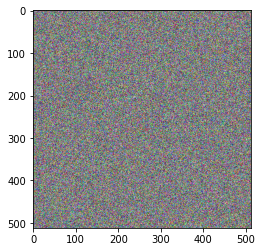

[ Step: 10 ]
Loss: 0.1042725145816803


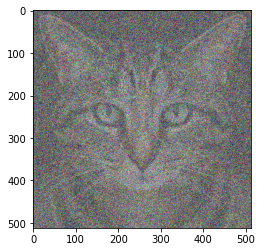

[ Step: 20 ]
Loss: 0.06229008361697197


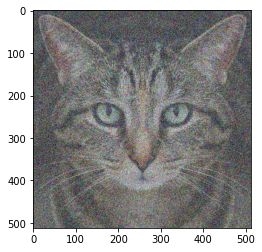

[ Step: 30 ]
Loss: 0.03721071034669876


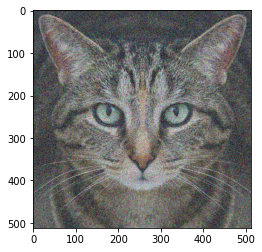

[ Step: 40 ]
Loss: 0.022228850051760674


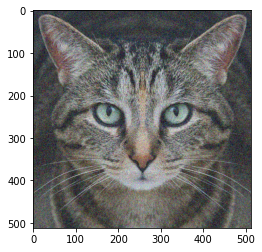

[ Step: 50 ]
Loss: 0.013279019854962826


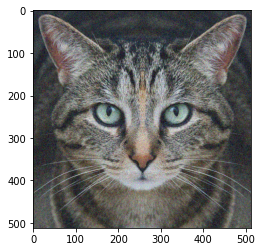

[ Step: 60 ]
Loss: 0.007932591252028942


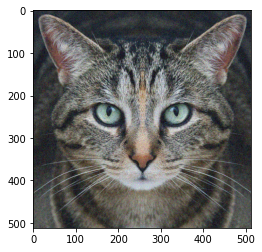

[ Step: 70 ]
Loss: 0.0047387536615133286


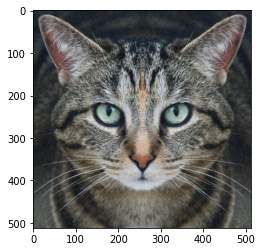

[ Step: 80 ]
Loss: 0.0028308257460594177


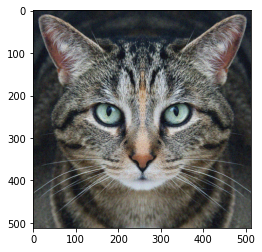

[ Step: 90 ]
Loss: 0.0016910722479224205


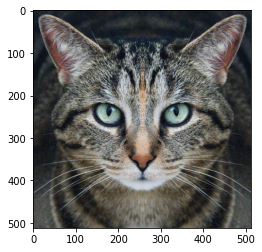

[ Step: 100 ]
Loss: 0.0010102089727297425


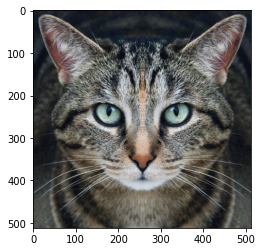

In [12]:
loss = nn.MSELoss() 
iters = 100 # iteration
lr = 1e4

print("[ Start ]")
imshow(noise)

for i in range(iters):
    # required_grad = True -> trace of computation of torch.Tensor
    noise.requires_grad = True

    # calculate gradient of loss
    output = loss(noise, target_image)
    output.backward()

    # update of gradient
    gradient = lr * noise.grad
    # cut the noise (perturbation) with the size of [-eps, eps] pixel
    noise = torch.clamp(noise - gradient, min=0, max=1).detach_() # call detach() to stop 

    if (i + 1) % 10 == 0:
        print(f'[ Step: {i + 1} ]')
        print(f'Loss: {output}')
        imshow(noise)

# Image transfer

[ Content Image ]


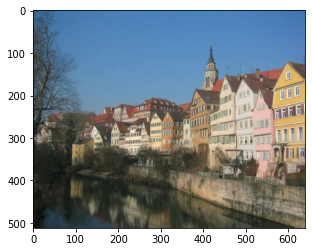

[ Style Image ]


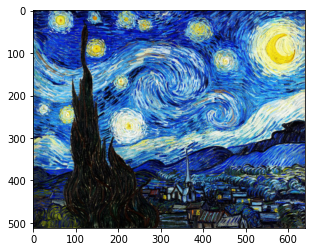

In [11]:
# Content and Style
content_img = image_loader('./MachineLearning/images/content_img_1.jpg', (512, 640))
style_img = image_loader('./MachineLearning/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

# CNN 
* either construct or built-in model
* VGG19 for feature extraction

In [13]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()
print(cnn)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [14]:
# Initialize for Normalization
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().view(-1, 1, 1)
        self.std = std.clone().view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

# Style Reconstruction

In [15]:
def gram_matrix(input):
    # a: batch, b: map, (c, d): dimension
    a, b, c, d = input.size()
    # 논문에서는 i = feature map, j = position
    features = input.view(a * b, c * d)
    # Performs a matrix multiplication of the matrices input and mat2 
    G = torch.mm(features, features.t())
    # divide Normalized one
    return G.div(a * b * c * d)


# style loss
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [16]:
style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

# calculate style loss
def get_style_losses(cnn, style_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    style_losses = []
    
    # input normalization
    model = nn.Sequential(normalization)

    # CNN
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        # style loss
        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # do not use any layers after style loss layer
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    return model, style_losses

In [17]:
# reconstruction
def style_reconstruction(cnn, style_img, input_img, iters):
    model, style_losses = get_style_losses(cnn, style_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print("[ Start ]")
    imshow(input_img)

    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0

            for sl in style_losses:
                style_score += sl.loss

            style_score *= 1e6
            style_score.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print(f"[ Step: {run[0]} / Style loss: {style_score.item()}]")
                imshow(input_img)
            
            return style_score
        
        optimizer.step(closure)

    # crop to set the value of pixel [0, 1]
    input_img.data.clamp_(0, 1)

    return input_img

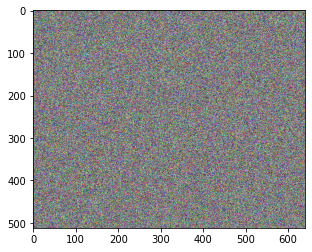

In [18]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


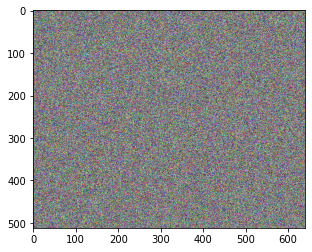

[ Step: 50 / Style loss: 426.4248352050781]


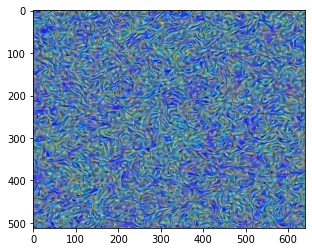

[ Step: 100 / Style loss: 104.25775146484375]


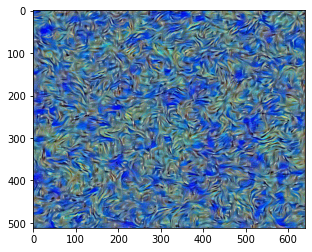

[ Step: 150 / Style loss: 49.54170608520508]


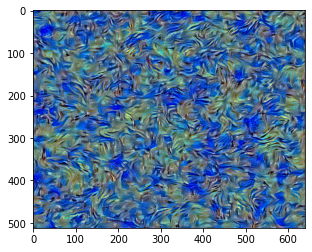

[ Step: 200 / Style loss: 34.744632720947266]


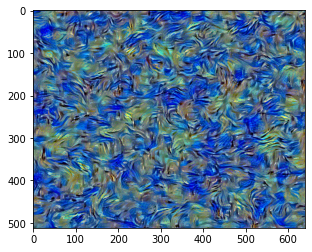

[ Step: 250 / Style loss: 27.974720001220703]


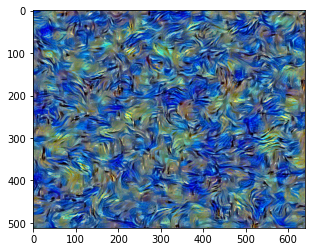

[ Step: 300 / Style loss: 23.324708938598633]


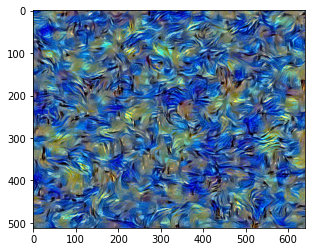

In [19]:
# style reconstruction
output = style_reconstruction(cnn, style_img=style_img, input_img=input_img, iters=300)

# Content Reconstruction

In [18]:
# content loss
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [19]:
content_layers = ['conv_4']

# calculate content loss
def get_content_losses(cnn, content_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    content_losses = []
    
    # input normalization
    model = nn.Sequential(normalization)

    # CNN
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target_feature = model(content_img).detach()
            content_loss = ContentLoss(target_feature)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss):
            break

    model = model[:(i + 1)]
    return model, content_losses

In [20]:
def content_reconstruction(cnn, content_img, input_img, iters):
    model, content_losses = get_content_losses(cnn, content_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print("[ Start ]")
    imshow(input_img)

    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            content_score = 0

            for cl in content_losses:
                content_score += cl.loss

            content_score.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print(f"[ Step: {run[0]} / Content loss: {content_score.item()}]")
                imshow(input_img)
            
            return content_score
        
        optimizer.step(closure)

    input_img.data.clamp_(0, 1)

    return input_img

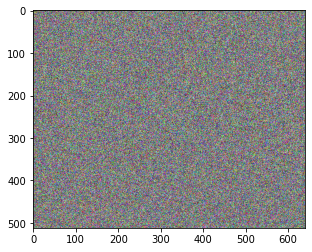

In [28]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


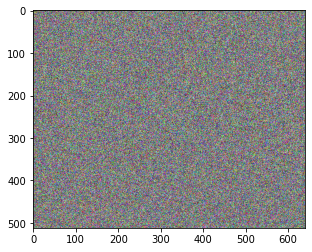

[ Step: 50 / Content loss: 0.755143940448761]


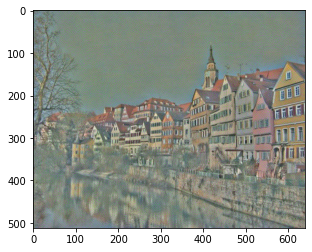

[ Step: 100 / Content loss: 0.37957704067230225]


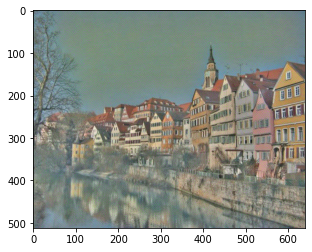

[ Step: 150 / Content loss: 0.24568696320056915]


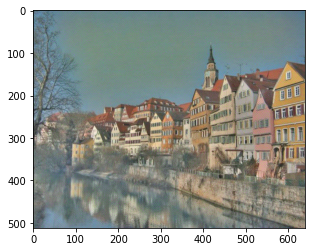

[ Step: 200 / Content loss: 0.17623738944530487]


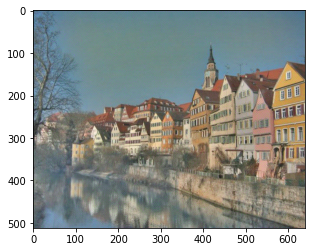

[ Step: 250 / Content loss: 0.13438934087753296]


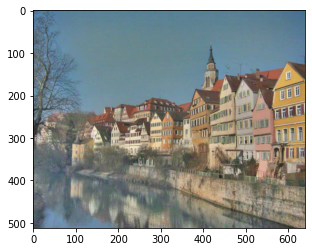

[ Step: 300 / Content loss: 0.1048101931810379]


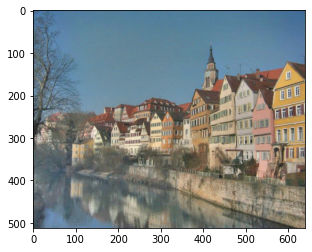

In [29]:
# content reconstruction
output = content_reconstruction(cnn, content_img=content_img, input_img=input_img, iters=300)

# Style Transfer 1

In [21]:
content_layers = ['conv_4']
style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_7', 'conv_9']

# Style Transfer loss
def get_losses(cnn, content_img, style_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    content_losses = []
    style_losses = []
    
    # input normalization
    model = nn.Sequential(normalization)

    # CNN
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target_feature = model(content_img).detach()
            content_loss = ContentLoss(target_feature)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    return model, content_losses, style_losses

In [22]:
def style_transfer(cnn, content_img, style_img, input_img, iters):
    model, content_losses, style_losses = get_losses(cnn, content_img, style_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print("[ Start ]")
    imshow(input_img)

    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            content_score = 0
            style_score = 0

            for cl in content_losses:
                content_score += cl.loss
            for sl in style_losses:
                style_score += sl.loss

            style_score *= 1e5
            loss = content_score + style_score
            loss.backward()

            run[0] += 1
            if run[0] % 100 == 0:
                print(f"[ Step: {run[0]} / Content loss: {content_score.item()} / Style loss: {style_score.item()}]")
                imshow(input_img)
            
            return content_score + style_score
        
        optimizer.step(closure)

    input_img.data.clamp_(0, 1)

    return input_img

[ Content Image ]


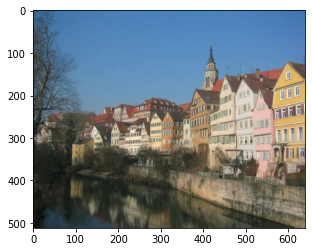

[ Style Image ]


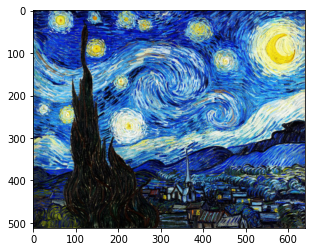

In [23]:
content_img = image_loader('./MachineLearning/images/content_img_1.jpg', (512, 640))
style_img = image_loader('./MachineLearning/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

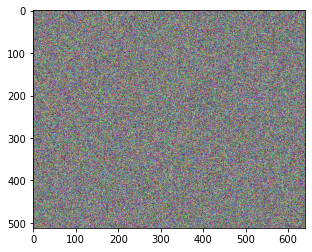

In [24]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


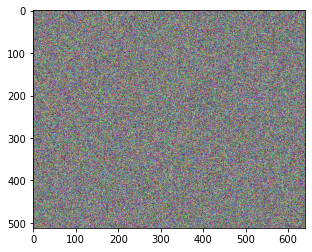

[ Step: 100 / Content loss: 44.652252197265625 / Style loss: 27.969449996948242]


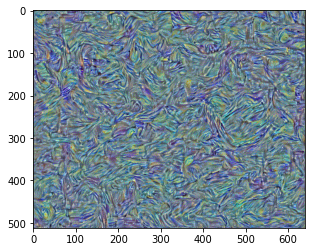

[ Step: 200 / Content loss: 37.04376983642578 / Style loss: 9.426559448242188]


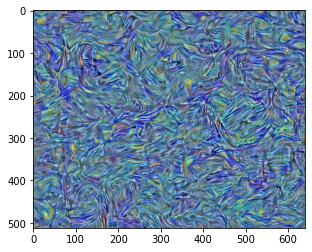

[ Step: 300 / Content loss: 31.231800079345703 / Style loss: 6.079019546508789]


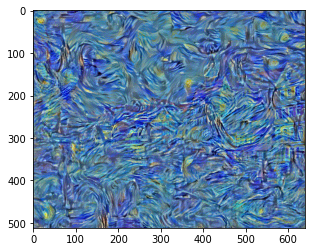

[ Step: 400 / Content loss: 27.74869155883789 / Style loss: 4.910438060760498]


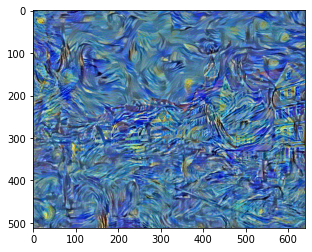

[ Step: 500 / Content loss: 25.513946533203125 / Style loss: 4.177196979522705]


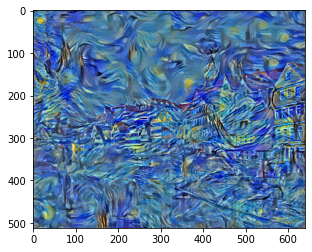

[ Step: 600 / Content loss: 23.83931541442871 / Style loss: 3.7908596992492676]


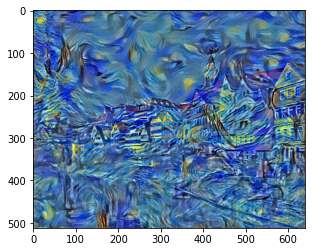

[ Step: 700 / Content loss: 22.68271827697754 / Style loss: 3.3382503986358643]


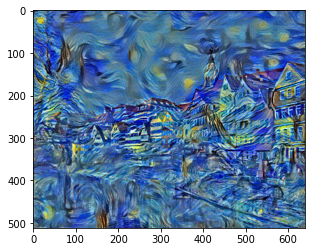

[ Step: 800 / Content loss: 21.769033432006836 / Style loss: 3.1363863945007324]


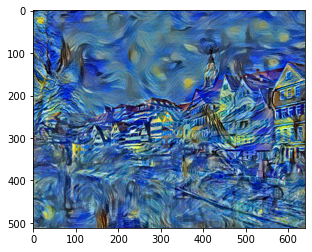

[ Step: 900 / Content loss: 21.02133560180664 / Style loss: 3.229417324066162]


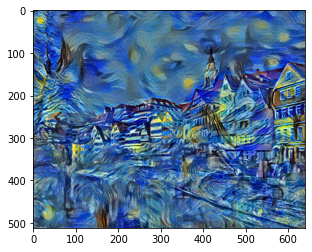

In [25]:
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=900)

In [26]:
from torchvision.utils import save_image

save_image(output.cpu().detach()[0], 'output_1.png')

In [27]:
from google.colab import files

files.download('output_1.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

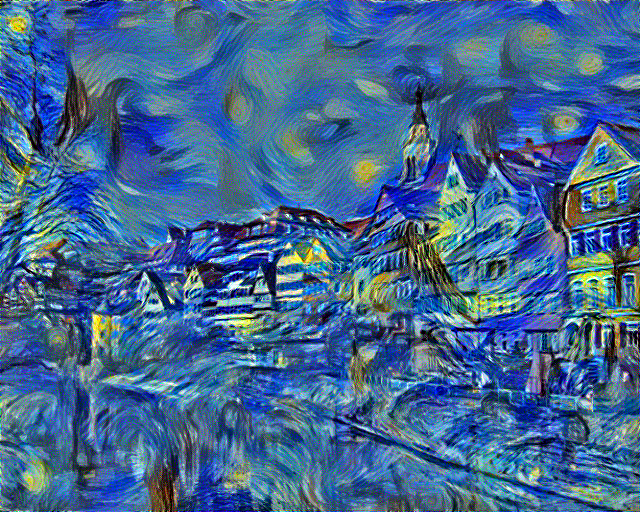

In [28]:
from IPython.display import Image

Image('output_1.png')

# Style Transfer 2

[ Content Image ]


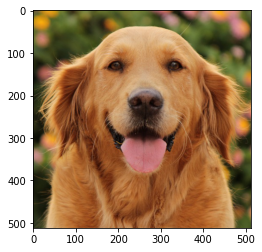

[ Style Image ]


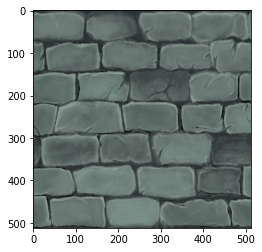

In [29]:
content_img = image_loader('./MachineLearning/images/content_img_2.jpg', (512, 512))
style_img = image_loader('./MachineLearning/images/style_img_2.jpg', (512, 512))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

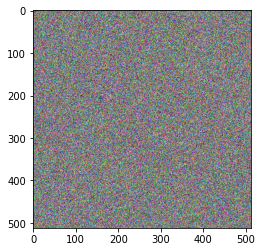

In [30]:
# same size of content and style image
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


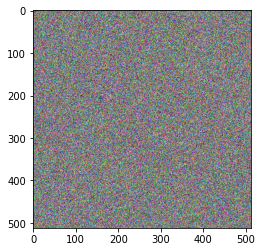

[ Step: 100 / Content loss: 12.30282974243164 / Style loss: 8.777487754821777]


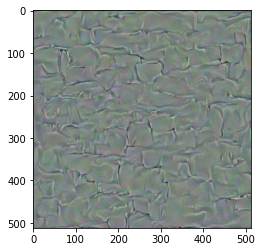

[ Step: 200 / Content loss: 8.739410400390625 / Style loss: 3.3747305870056152]


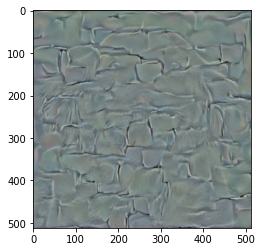

[ Step: 300 / Content loss: 6.899905204772949 / Style loss: 2.1990439891815186]


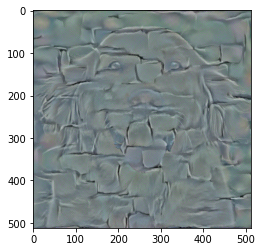

[ Step: 400 / Content loss: 5.80751895904541 / Style loss: 1.7016842365264893]


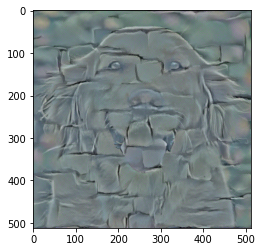

[ Step: 500 / Content loss: 5.132848262786865 / Style loss: 1.4129424095153809]


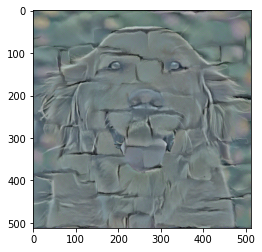

[ Step: 600 / Content loss: 4.691173553466797 / Style loss: 1.2130553722381592]


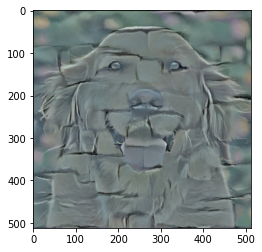

[ Step: 700 / Content loss: 4.384037017822266 / Style loss: 1.0682231187820435]


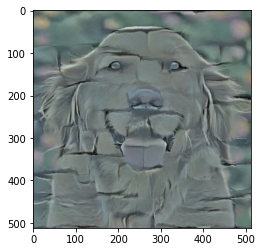

[ Step: 800 / Content loss: 4.173923969268799 / Style loss: 0.9676856398582458]


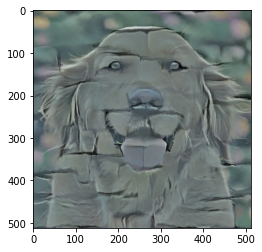

[ Step: 900 / Content loss: 4.02128267288208 / Style loss: 0.8911605477333069]


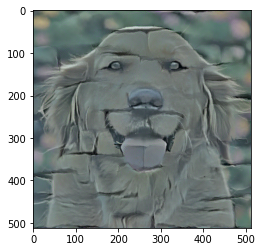

In [31]:
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=900)

In [33]:
save_image(output.cpu().detach()[0], 'output_2.png')

In [34]:
files.download('output_2.png')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

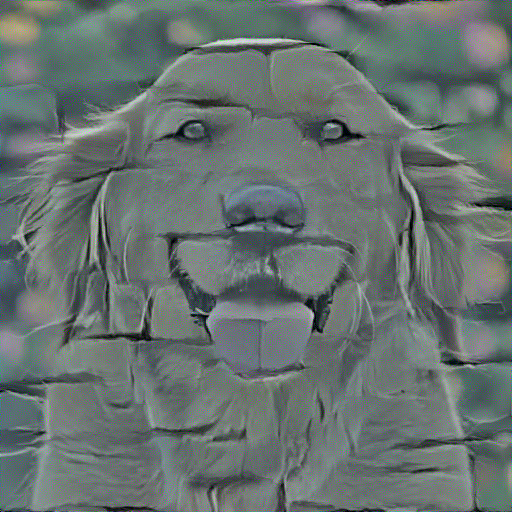

In [35]:
Image('output_2.png')